In [ ]:
import sys
print(sys.executable)

/usr/bin/python3


In [ ]:
!pip install numpy pandas scikit-learn matplotlib seaborn jupyter opencv-python tensorflow ipykernel

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
import itertools
import random


import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2
import seaborn as sns


from tensorflow import keras
from tensorflow.keras import layers,models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import Model
from tensorflow.keras import preprocessing
from tensorflow.keras.optimizers import Adam


from pathlib import Path
import os.path


from sklearn.metrics import classification_report, confusion_matrix

sns.set_style('darkgrid')

import tensorflow as tf
import numpy as np
import random
import os

def seed_everything(seed=42):
    # 1. Seed value for Python's random library
    random.seed(seed)
    
    # 2. Seed value for NumPy
    np.random.seed(seed)
    
    # 3. Seed value for TensorFlow
    tf.random.set_seed(seed)
    
    # 4. Set deterministic operations (Important for TF 2.x reproducibility)
    # This might require an environment variable to be set *before* TF imports,
    # but the function call helps.
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ['PYTHONHASHSEED'] = str(seed)

    print(f"Seeding with {seed} for reproducibility done.")

seed_everything(42)

In [ ]:
!curl -O https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 10246  100 10246    0     0   139k      0 --:--:-- --:--:-- --:--:--  140k


In [ ]:
from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir, pred_and_plot

In [ ]:
import cv2
import numpy as np


def sharpen_image(image):
    kernel = np.array([[-1, -1, -1], [-1,  9, -1], [-1, -1, -1]])
    return cv2.filter2D(image, -1, kernel)

def blur_image(image):
    return cv2.GaussianBlur(image, (5, 5), 0)

def detect_edges(image):

    image_uint8 = np.uint8(image * 255)
    gray_image = cv2.cvtColor(image_uint8, cv2.COLOR_BGR2GRAY)


    edges = cv2.Canny(gray_image, threshold1=100, threshold2=200)

    edges_bgr = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)


    return edges_bgr / 255.0

  def enhance_contrast(image):

    ycrcb_image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
    ycrcb_image[:, :, 0] = cv2.equalizeHist(ycrcb_image[:, :, 0])

    equalized_image = cv2.cvtColor(ycrcb_image, cv2.COLOR_YCrCb2BGR)
    return equalized_image

def apply_filter(image):

    return blur_image(image)

In [ ]:
BATCH_SIZE = 32
TARGET_SIZE = (224, 224)

In [ ]:
import kagglehub


path = kagglehub.dataset_download("vencerlanz09/healthy-and-bleached-corals-image-classification")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'healthy-and-bleached-corals-image-classification' dataset.
Path to dataset files: /kaggle/input/healthy-and-bleached-corals-image-classification


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from pathlib import Path


data_dir = Path("/root/.cache/kagglehub/datasets/vencerlanz09/healthy-and-bleached-corals-image-classification/versions/1")


IMG_SIZE = (224, 224)
BATCH_SIZE = 32


datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,  # 80% for training, 20% for validation
    preprocessing_function=apply_filter
)


print("Loading training data...")
train_generator = datagen.flow_from_directory(
    data_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary',
    subset='training',
    seed=42
)


print("Loading validation data...")
validation_generator = datagen.flow_from_directory(
    data_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary',
    subset='validation',
    seed=42
)


print("\nClass Indices:")
print(train_generator.class_indices)

In [ ]:
from pathlib import Path
import os

dataset = data_dir

def convert_path_to_df(dataset):
    """
    Creates a Pandas DataFrame with two columns: 'Filepath' (the image path)
    and 'Label' (the class name from the parent directory).
    """
    image_dir = Path(dataset)

    filepaths = list(image_dir.glob(r'**/*.JPG')) + \
                list(image_dir.glob(r'**/*.jpg')) + \
                list(image_dir.glob(r'**/*.jpeg')) + \
                list(image_dir.glob(r'**/*.PNG'))


    labels = list(map(lambda x: os.path.split(os.path.split(str(x))[0])[1], filepaths))



    filepaths = pd.Series(filepaths, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')


    image_df = pd.concat([filepaths, labels], axis=1)

    return image_df


image_df = convert_path_to_df(dataset)

print("--- image_df Head ---")
print(image_df.head())
print("\n--- Label Counts ---")
print(image_df['Label'].value_counts())

--- image_df Head ---
                                            Filepath            Label
0  /root/.cache/kagglehub/datasets/vencerlanz09/h...  bleached_corals
1  /root/.cache/kagglehub/datasets/vencerlanz09/h...  bleached_corals
2  /root/.cache/kagglehub/datasets/vencerlanz09/h...  bleached_corals
3  /root/.cache/kagglehub/datasets/vencerlanz09/h...  bleached_corals
4  /root/.cache/kagglehub/datasets/vencerlanz09/h...  bleached_corals

--- Label Counts ---
Label
bleached_corals    484
healthy_corals     438
Name: count, dtype: int64


In [ ]:
import PIL
from pathlib import Path
from PIL import UnidentifiedImageError

print(f"Starting image validation check on files in: {dataset}")
print("-" * 40)

path = Path(dataset).rglob("*.jpg")

corrupted_count = 0

for img_p in path:
    try:

        img = PIL.Image.open(img_p)

        img.verify()

    except (PIL.UnidentifiedImageError, ValueError, OSError) as e:

        print(f"CORRUPTED/INVALID: {img_p} (Error: {e})")
        corrupted_count += 1

print("-" * 40)
if corrupted_count == 0:
    print("SUCCESS: All image files are valid!")
else:
    print(f"WARNING: Found {corrupted_count} corrupted files. You should delete them or remove them from your DataFrame.")

Starting image validation check on files in: /root/.cache/kagglehub/datasets/vencerlanz09/healthy-and-bleached-corals-image-classification/versions/1
----------------------------------------
----------------------------------------
SUCCESS: All image files are valid!


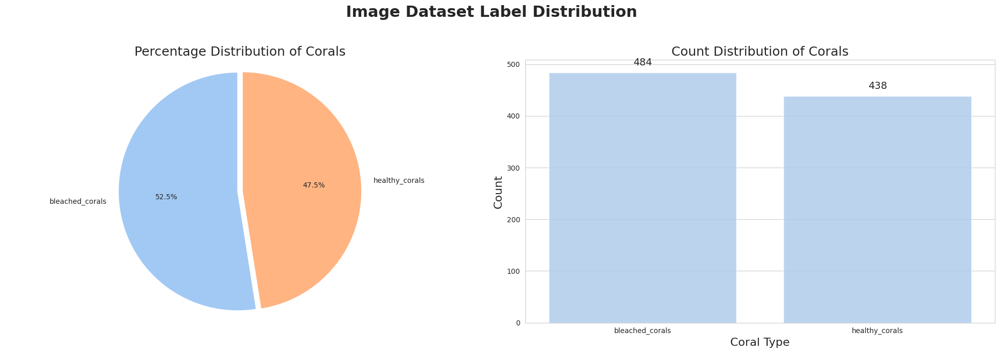

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


sns.set_style('whitegrid')

label_counts = image_df['Label'].value_counts()


fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 7))


colors = sns.color_palette('pastel', len(label_counts))


explode = [0.02] * len(label_counts)
axes[0].pie(
    label_counts.values,
    labels=label_counts.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=colors,
    explode=explode
)
axes[0].axis('equal')
axes[0].set_title('Percentage Distribution of Corals', fontsize=18)


sns.barplot(
    x=label_counts.index,
    y=label_counts.values,
    alpha=0.8,
    color=colors[0],
    ax=axes[1]
)
axes[1].set_title('Count Distribution of Corals', fontsize=18)
axes[1].set_xlabel('Coral Type', fontsize=16)
axes[1].set_ylabel('Count', fontsize=16)


axes[1].set_xticks(axes[1].get_xticks())
axes[1].set_xticklabels(label_counts.index, rotation=0)


for i, count in enumerate(label_counts.values):
    axes[1].text(i, count + 10, str(count), ha='center', va='bottom', fontsize=14)


fig.suptitle('Image Dataset Label Distribution', fontsize=22, fontweight='bold')


fig.tight_layout(rect=[0, 0, 1, 0.95])

plt.show()

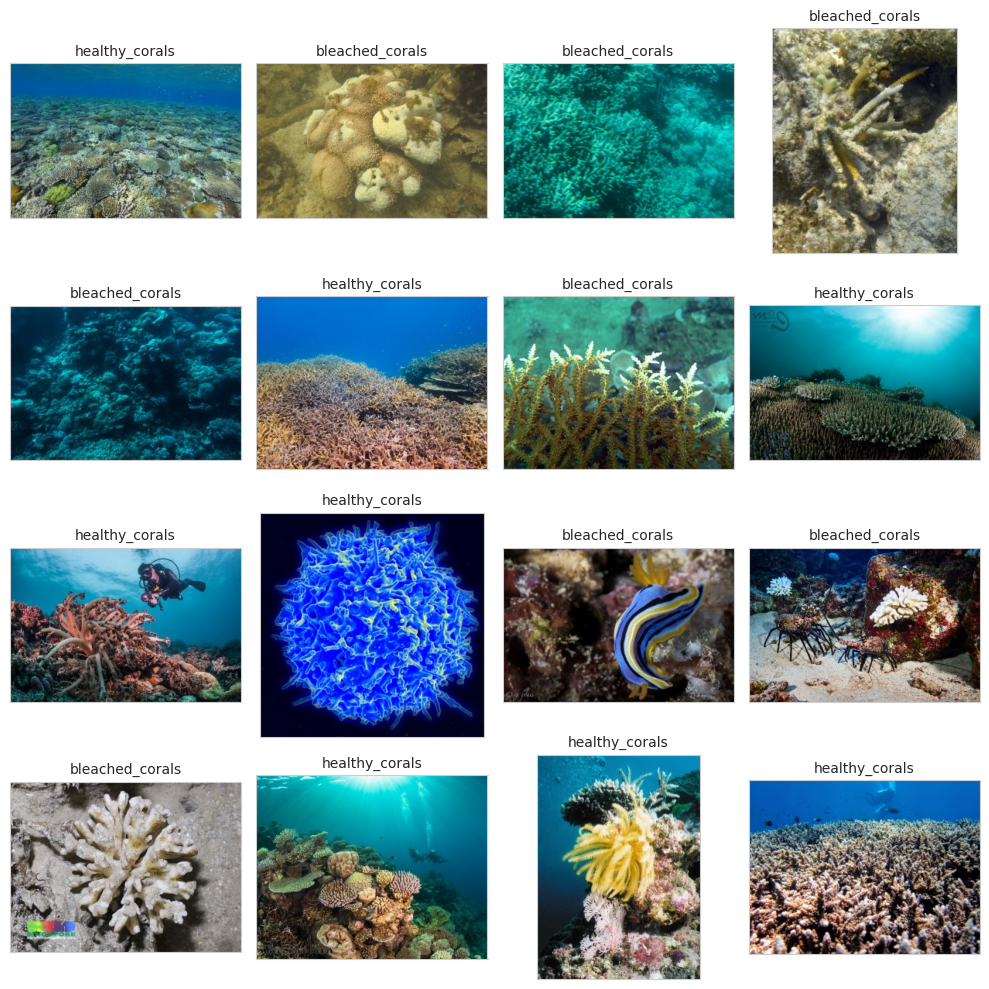

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd


random_index = np.random.randint(0, len(image_df), 16)

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})


for i, ax in enumerate(axes.flat):


    filepath = image_df.Filepath.iloc[random_index[i]]
    img = plt.imread(filepath)
    ax.imshow(img)


    label = image_df.Label.iloc[random_index[i]]
    ax.set_title(label, fontsize=10)

plt.tight_layout()
plt.show()

Analyzing image: 15078840770_a92306a0bd_o.jpg


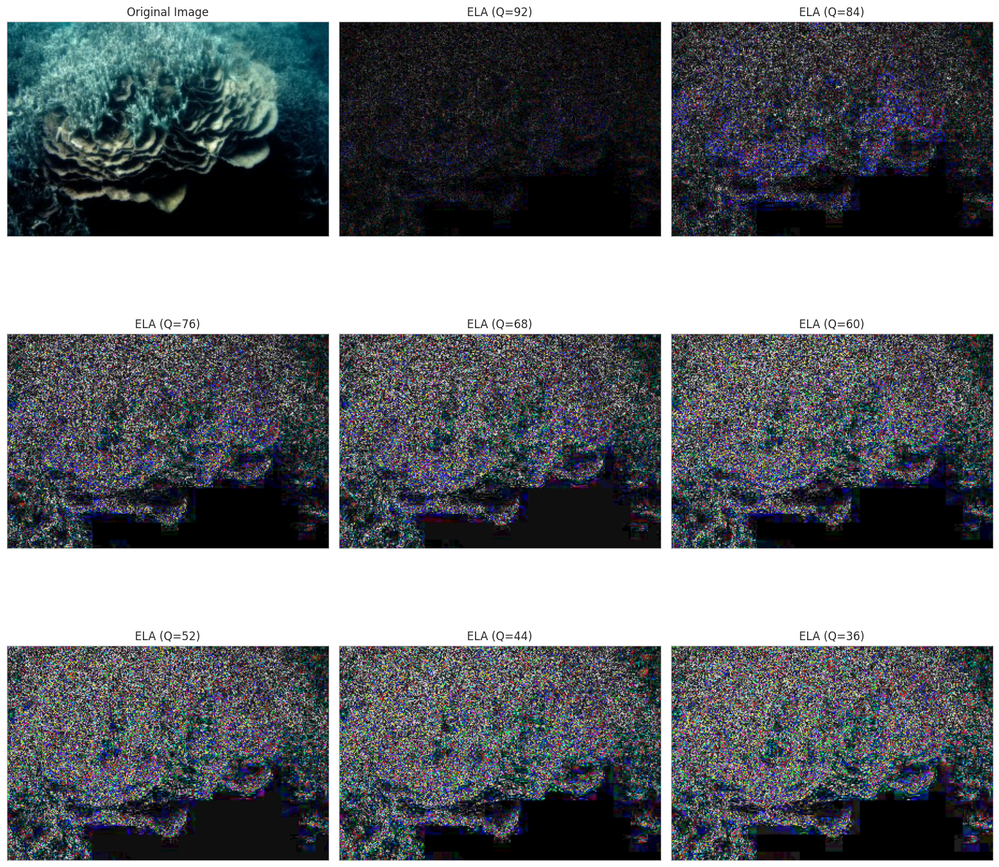

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from pathlib import Path
from PIL import Image




ROOT_DATA_DIR = data_dir
BLEACHED_CORALS_DIR = ROOT_DATA_DIR / "bleached_corals"


def random_sample(dir_path):
    """Selects a random image file path from a directory."""
    files = list(Path(dir_path).glob('*.jpg'))
    if not files:
        raise FileNotFoundError(f"No .jpg files found in {dir_path}")
    return str(np.random.choice(files))


def compute_ela_cv(path, quality=90):
    """
    Computes Error Level Analysis (ELA) using OpenCV.

    1. Saves the original image at a specified quality.
    2. Subtracts the re-saved image from the original.
    3. Rescales the difference (errors) for visualization.
    """

    orig_img = Image.open(path).convert('RGB')


    temp_path = 'temp_ela.jpg'
    orig_img.save(temp_path, 'JPEG', quality=quality)


    orig = cv2.imread(path)
    resaved = cv2.imread(temp_path)


    if orig is None or resaved is None:
        raise ValueError("Could not read image files for ELA.")


    ela_img = cv2.absdiff(orig, resaved)


    ela_img = ela_img * 15


    ela_img = cv2.cvtColor(ela_img.astype(np.uint8), cv2.COLOR_BGR2RGB)


    os.remove(temp_path)

    return ela_img



p = random_sample(BLEACHED_CORALS_DIR)
print(f"Analyzing image: {Path(p).name}")


orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0

init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 15))
for i in range(1, columns * rows + 1):

    quality = init_val - (i - 1) * 8

    if i == 1:

        img = orig.copy()
        title = 'Original Image'
    else:

        img = compute_ela_cv(path=p, quality=quality)
        title = f'ELA (Q={quality})'

    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(title)
    ax.set_xticks([]); ax.set_yticks([])
    plt.imshow(img)

plt.tight_layout()
plt.show()

In [ ]:

train_df, test_df = train_test_split(image_df, test_size=0.2, shuffle=True, random_state=42)

In [ ]:
train_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg19.preprocess_input,
    validation_split=0.2
)

test_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg19.preprocess_input
)

In [ ]:


train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 590 validated image filenames belonging to 2 classes.
Found 147 validated image filenames belonging to 2 classes.
Found 185 validated image filenames belonging to 2 classes.


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers


augment = tf.keras.Sequential([

    layers.Resizing(224, 224),


    layers.Rescaling(1./255),


    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
])

print("Data augmentation pipeline successfully defined.")

Data augmentation pipeline successfully defined.


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19


pretrained_model = VGG19(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='max'
)


pretrained_model.trainable = False

print("VGG19 base model loaded and layers frozen.")

VGG19 base model loaded and layers frozen.


In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau


checkpoint_path = "corals_classification_model_checkpoint.weights.h5"


checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)


early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)


reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-10
)

print(f"Success! Checkpoint path set to: {checkpoint_path} and callbacks defined.")

Success! Checkpoint path set to: corals_classification_model_checkpoint.weights.h5 and callbacks defined.


In [ ]:
import datetime
def create_tensorboard_callback(dir_name, experiment_name):
    """Creates a TensorBoard callback to save logs."""
    log_dir = dir_name + "/" + experiment_name + "/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
    return tensorboard_callback

In [ ]:
from PIL import Image, UnidentifiedImageError
import pandas as pd
import os

def is_valid_image(filepath):
    """Checks if a file can be opened and verified by PIL."""
    try:

        with Image.open(filepath) as img:

            img.verify()
        return True
    except (FileNotFoundError, UnidentifiedImageError, IOError, IsADirectoryError):

        return False
    except Exception as e:

        print(f"Unexpected error verifying {filepath}: {e}")
        return False


print("Starting image integrity check on the original dataframe...")

image_df['is_valid'] = image_df['Filepath'].apply(is_valid_image)
corrupted_count = len(image_df) - image_df['is_valid'].sum()


image_df_clean = image_df[image_df['is_valid']].drop(columns=['is_valid'])

print(f"Original Samples: {len(image_df)}")
print(f"Removed Corrupted/Invalid Samples: {corrupted_count}")
print(f"Clean Samples Remaining: {len(image_df_clean)}")




train_df_clean, test_df_clean = train_test_split(image_df_clean, test_size=0.2, shuffle=True, random_state=42)

print(f"\nClean Training Samples: {len(train_df_clean)}")
print(f"Clean Test Samples: {len(test_df_clean)}")


train_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg19.preprocess_input,
    validation_split=0.2
)

test_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg19.preprocess_input
)



train_images = train_generator.flow_from_dataframe(
    dataframe=train_df_clean,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_df_clean,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df_clean,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Starting image integrity check on the original dataframe...
Original Samples: 922
Removed Corrupted/Invalid Samples: 0
Clean Samples Remaining: 922

Clean Training Samples: 737
Clean Test Samples: 185
Found 590 validated image filenames belonging to 2 classes.
Found 147 validated image filenames belonging to 2 classes.
Found 185 validated image filenames belonging to 2 classes.


In [ ]:
inputs = pretrained_model.input
x = augment(inputs)


outputs = Dense(2, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer=Adam(0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    steps_per_epoch=len(train_images),
    validation_data=val_images,
    validation_steps=len(val_images),
    epochs=100,
    callbacks=[
        early_stopping,
        create_tensorboard_callback("training_logs",
                                    "corals_classification"),
        checkpoint_callback,
        reduce_lr
    ]
)

Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 15s/step - accuracy: 0.5703 - loss: 0.9699 
Epoch 1: val_accuracy improved from -inf to 0.61905, saving model to corals_classification_model_checkpoint.weights.h5
19/19 ━━━━━━━━━━━━━━━━━━━━ 356s 19s/step - accuracy: 0.5712 - loss: 0.9707 - val_accuracy: 0.6190 - val_loss: 1.1631 - learning_rate: 0.0010
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 15s/step - accuracy: 0.6665 - loss: 0.7974 
Epoch 2: val_accuracy did not improve from 0.61905
19/19 ━━━━━━━━━━━━━━━━━━━━ 363s 19s/step - accuracy: 0.6684 - loss: 0.7955 - val_accuracy: 0.6190 - val_loss: 1.2313 - learning_rate: 0.0010
Epoch 3/100
 4/19 ━━━━━━━━━━━━━━━━━━━━ 3:54 16s/step - accuracy: 0.7096 - loss: 0.6996

In [ ]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))


    Test Loss: 0.62982
Test Accuracy: 67.57%


**Replace your existing model definition with the code below to fix the shape mismatch.**

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models



# Build the corrected model
model = models.Sequential([
    # Add the data augmentation layers as the first layer
    # Make sure your augment layer correctly handles input shape or add Input layer
    # augment, # Uncomment and ensure 'augment' is defined and configured correctly

    # Add the pretrained VGG19 model (assuming it was loaded as 'pretrained_model' and frozen)
    # You might need an Input layer if augment is not used here directly and your pretrained_model doesn't handle batching
    # tf.keras.Input(shape=(224, 224, 3)), # Example Input layer if needed
    pretrained_model, # Use the pre-trained VGG19 model


    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(2, activation='softmax')

])


model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mock_pretrained (Functional)    │ (None, 3)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 3)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 2)              │           514 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,538 (6.01 KB)

 Trainable params: 1,538 (6.01 KB)

 Non-trainable params: 0 (0.00 B)

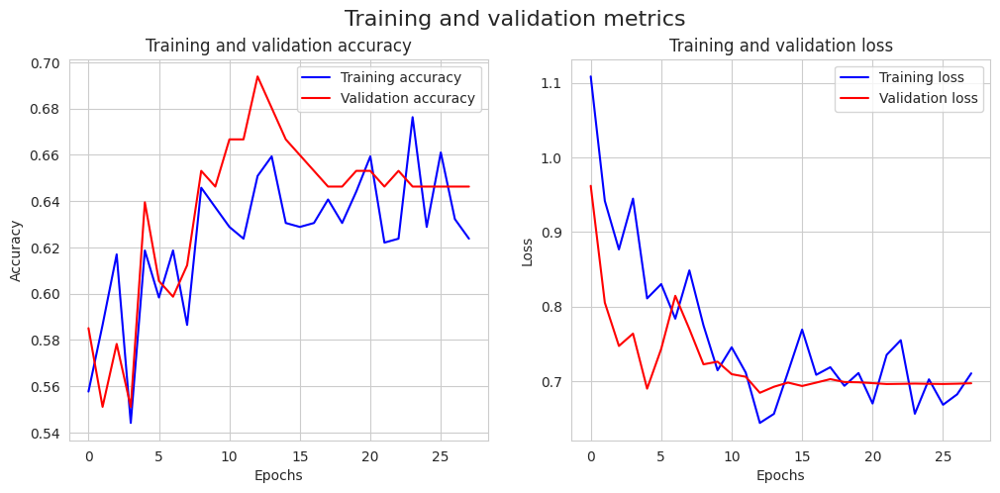

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.plot(epochs, accuracy, 'b', label='Training accuracy')
ax1.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
ax1.set_title('Training and validation accuracy')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'b', label='Training loss')
ax2.plot(epochs, val_loss, 'r', label='Validation loss')
ax2.set_title('Training and validation loss')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.legend()

fig.suptitle('Training and validation metrics', fontsize=16)
plt.show()

In [ ]:

pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)


labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]


print(f'The first 5 predictions: {pred[:5]}')

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step
The first 5 predictions: ['bleached_corals', 'bleached_corals', 'bleached_corals', 'healthy_corals', 'healthy_corals']


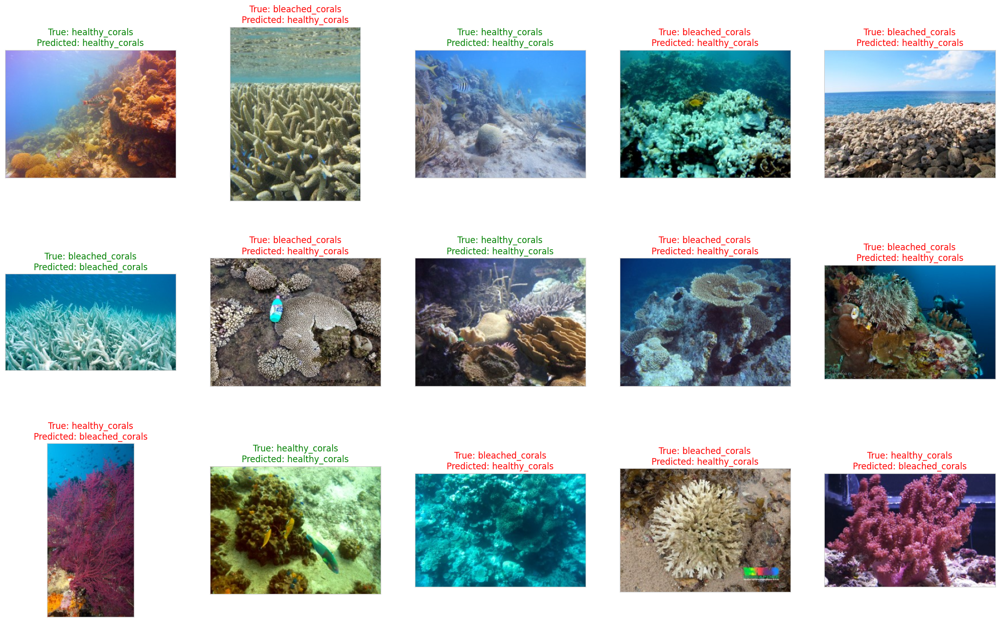

<Figure size 640x480 with 0 Axes>

In [ ]:

random_index = np.random.randint(0, len(test_df_clean) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df_clean.Filepath.iloc[random_index[i]]))
    if test_df_clean.Label.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {test_df_clean.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

In [ ]:
y_test = list(test_df_clean.Label)
print(classification_report(y_test, pred))

                 precision    recall  f1-score   support

bleached_corals       0.56      0.16      0.25        92
 healthy_corals       0.51      0.87      0.65        93

       accuracy                           0.52       185
      macro avg       0.53      0.52      0.45       185
   weighted avg       0.53      0.52      0.45       185



In [ ]:
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
bleached_corals,0.555556,0.163043,0.252101,92.000000
healthy_corals,0.512658,0.870968,0.645418,93.000000
accuracy,0.518919,0.518919,0.518919,0.518919
macro avg,0.534107,0.517006,0.448760,185.000000
weighted avg,0.533991,0.518919,0.449823,185.000000


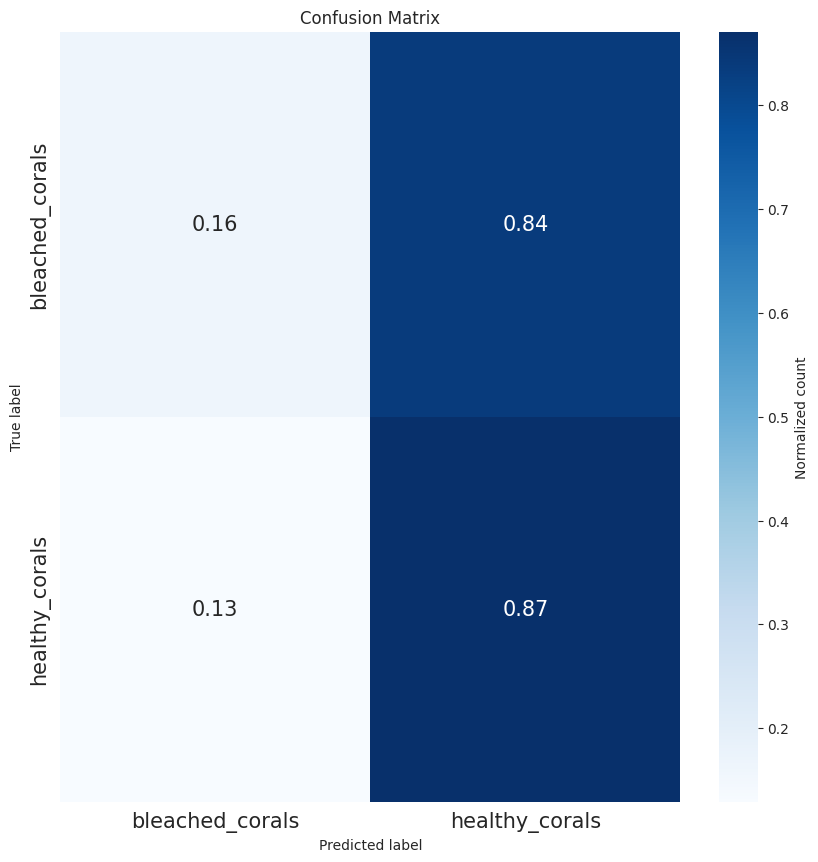

In [ ]:
make_confusion_matrix(y_test, pred, list(labels.values()))

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15):
    """
    Displays a beautiful confusion matrix using Seaborn's heatmap.

    Args:
        y_true: Array of truth labels.
        y_pred: Array of predicted labels.
        classes: List of class names.
        figsize: Size of the figure.
        text_size: Size of the text within the heatmap.
    """

    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]
    n_classes = cm.shape[0]


    fig, ax = plt.subplots(figsize=figsize)
    cbar_kws={'label': 'Normalized count'}
    sns.heatmap(cm_norm, annot=True, fmt=".2f", ax=ax, cmap="Blues", cbar_kws=cbar_kws)
    ax.set(title="Confusion Matrix",
           xlabel="Predicted label",
           ylabel="True label")


    if classes:
        ax.set_xticklabels(classes)
        ax.set_yticklabels(classes)


    for text_item in ax.get_yticklabels():
        text_item.set_fontsize(text_size)
    for text_item in ax.get_xticklabels():
        text_item.set_fontsize(text_size)
    for text_item in ax.texts:
        text_item.set_fontsize(text_size)

    plt.show()

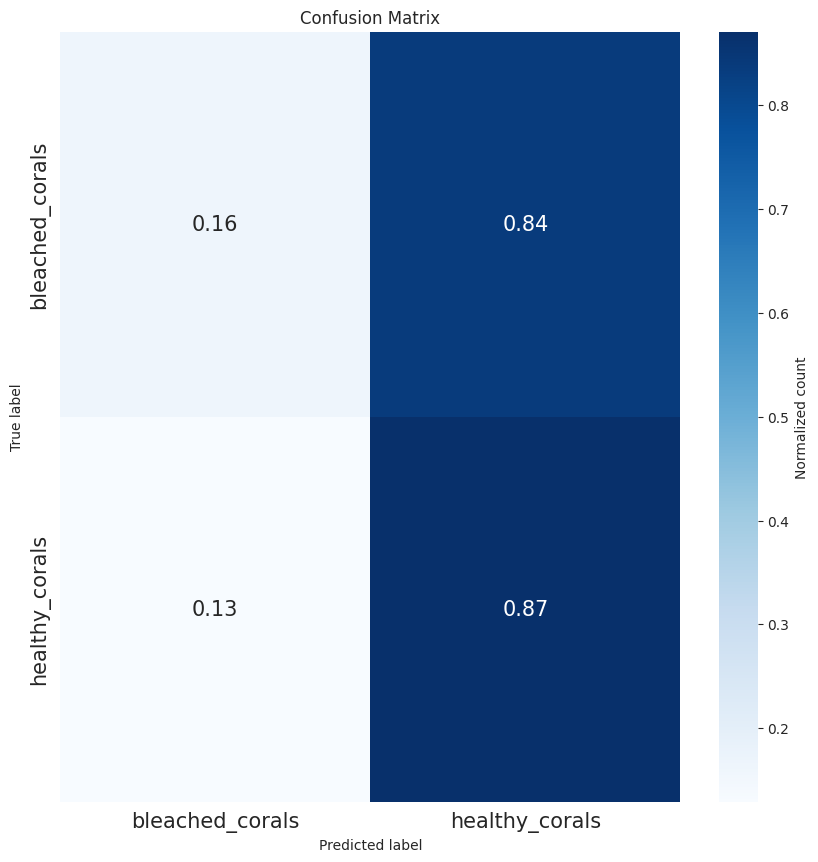

In [ ]:
make_confusion_matrix(y_test, pred, list(labels.values()))